In [84]:
! pip install autoviz

In [85]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn import tree, ensemble
from sklearn.model_selection import StratifiedShuffleSplit
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.datasets import load_iris
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import OneHotEncoder
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import StandardScaler
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import RBF, ConstantKernel as C
from sklearn.naive_bayes import GaussianNB
from sklearn.neural_network import MLPClassifier
from sklearn.model_selection import cross_val_score, GridSearchCV
from sklearn.linear_model import LogisticRegression, LinearRegression
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from IPython.display import clear_output

In [86]:
orig_inputs = np.load ("./initial_inputs.npy")
orig_outputs = np.load ("./initial_outputs.npy")

In [87]:
orig_inputs

array([[0.66579958, 0.12396913],
       [0.87779099, 0.7786275 ],
       [0.14269907, 0.34900513],
       [0.84527543, 0.71112027],
       [0.45464714, 0.29045518],
       [0.57771284, 0.77197318],
       [0.43816606, 0.68501826],
       [0.34174959, 0.02869772],
       [0.33864816, 0.21386725],
       [0.70263656, 0.9265642 ]])

In [88]:
# Add the new data points
new_data = np.array([0.577713, 0.771973])
inputs = np.vstack([orig_inputs, new_data])

len(orig_inputs), len(inputs)

(10, 11)

In [89]:
inputs

array([[0.66579958, 0.12396913],
       [0.87779099, 0.7786275 ],
       [0.14269907, 0.34900513],
       [0.84527543, 0.71112027],
       [0.45464714, 0.29045518],
       [0.57771284, 0.77197318],
       [0.43816606, 0.68501826],
       [0.34174959, 0.02869772],
       [0.33864816, 0.21386725],
       [0.70263656, 0.9265642 ],
       [0.577713  , 0.771973  ]])

In [90]:
outputs = np.append(orig_outputs, 0.13026695633593488)

In [91]:
orig_outputs

array([ 0.53899612,  0.42058624, -0.06562362,  0.29399291,  0.21496451,
        0.02310555,  0.24461934,  0.03874902, -0.01385762,  0.61120522])

In [92]:
outputs

array([ 0.53899612,  0.42058624, -0.06562362,  0.29399291,  0.21496451,
        0.02310555,  0.24461934,  0.03874902, -0.01385762,  0.61120522,
        0.13026696])

In [93]:
data = {'feature1': inputs[:,0],
        'feature2': inputs[:,1],
        'target': outputs
       }

df = pd.DataFrame(data)
df

,feature1,feature2,target
0,0.665800,0.123969,0.538996
1,0.877791,0.778628,0.420586
2,0.142699,0.349005,-0.065624
3,0.845275,0.711120,0.293993
4,0.454647,0.290455,0.214965
5,0.577713,0.771973,0.023106
6,0.438166,0.685018,0.244619
7,0.341750,0.028698,0.038749
8,0.338648,0.213867,-0.013858
9,0.702637,0.926564,0.611205


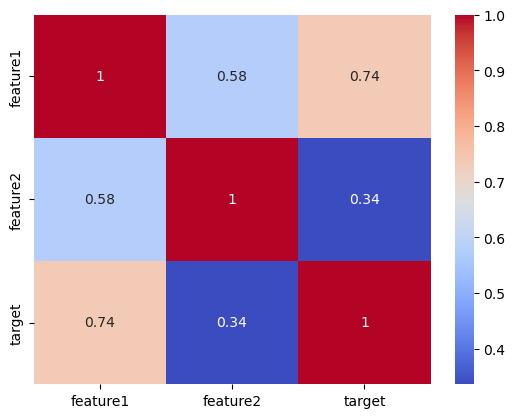

In [94]:
# Display correlation to Output Outcome
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from matplotlib.animation import FuncAnimation
from IPython.display import HTML
import seaborn as sns
numerical_df = df.select_dtypes(include=[np.number])
correlation_matrix = numerical_df.corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
plt.show()

In [95]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11 entries, 0 to 10
Data columns (total 3 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   feature1  11 non-null     float64
 1   feature2  11 non-null     float64
 2   target    11 non-null     float64
dtypes: float64(3)
memory usage: 396.0 bytes


In [96]:
df.describe()

,feature1,feature2,target
count,11.000000,11.000000,11.000000
mean,0.542076,0.513752,0.221546
std,0.225326,0.315651,0.227389
min,0.142699,0.028698,-0.065624
25%,0.389958,0.252161,0.030927
50%,0.577713,0.685018,0.214965
75%,0.684218,0.771973,0.357290
max,0.877791,0.926564,0.611205


In [97]:
df.describe(percentiles=[0.1, 0.25, 0.5, 0.75, 0.9, 0.95, 0.97, 0.99])

,feature1,feature2,target
count,11.000000,11.000000,11.000000
mean,0.542076,0.513752,0.221546
std,0.225326,0.315651,0.227389
min,0.142699,0.028698,-0.065624
10%,0.338648,0.123969,-0.013858
25%,0.389958,0.252161,0.030927
50%,0.577713,0.685018,0.214965
75%,0.684218,0.771973,0.357290
90%,0.845275,0.778628,0.538996
95%,0.861533,0.852596,0.575101


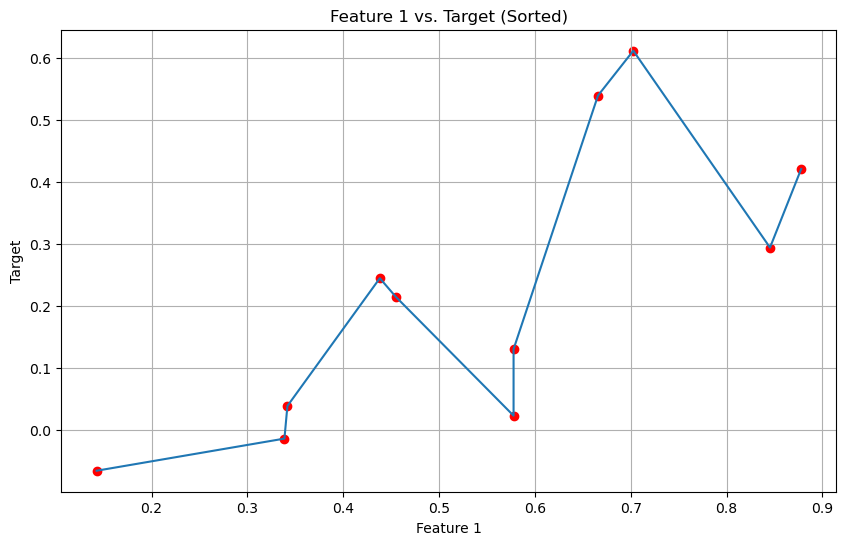

In [98]:
import matplotlib.pyplot as plt

# Sort the DataFrame by 'feature1'
df_sorted = df.sort_values('feature1')

# Plot 'feature1' against 'target' with connected points
plt.figure(figsize=(10, 6))
plt.plot(df_sorted['feature1'], df_sorted['target'], linestyle='-')
plt.scatter(df_sorted['feature1'], df_sorted['target'], color='red', label='Samples')
plt.xlabel('Feature 1')
plt.ylabel('Target')
plt.title('Feature 1 vs. Target (Sorted)')
plt.grid(True)
plt.show()

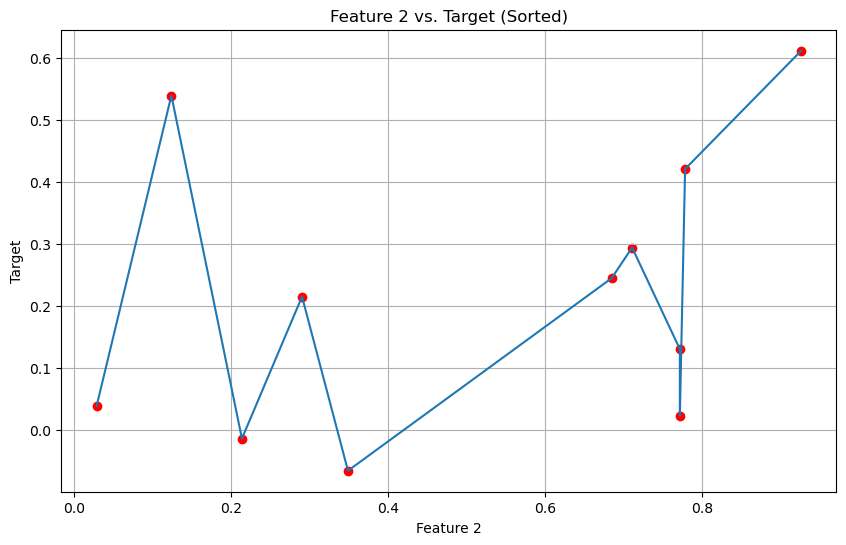

In [99]:
# Sort the DataFrame by 'feature2'
df_sorted = df.sort_values('feature2')

# Plot 'feature2' against 'target' with connected points
plt.figure(figsize=(10, 6))
plt.plot(df_sorted['feature2'], df_sorted['target'], linestyle='-')
plt.scatter(df_sorted['feature2'], df_sorted['target'], color='red', label='Samples')
plt.xlabel('Feature 2')
plt.ylabel('Target')
plt.title('Feature 2 vs. Target (Sorted)')
plt.grid(True)
plt.show()

/opt/anaconda3/lib/python3.12/site-packages/sklearn/gaussian_process/kernels.py:445: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(


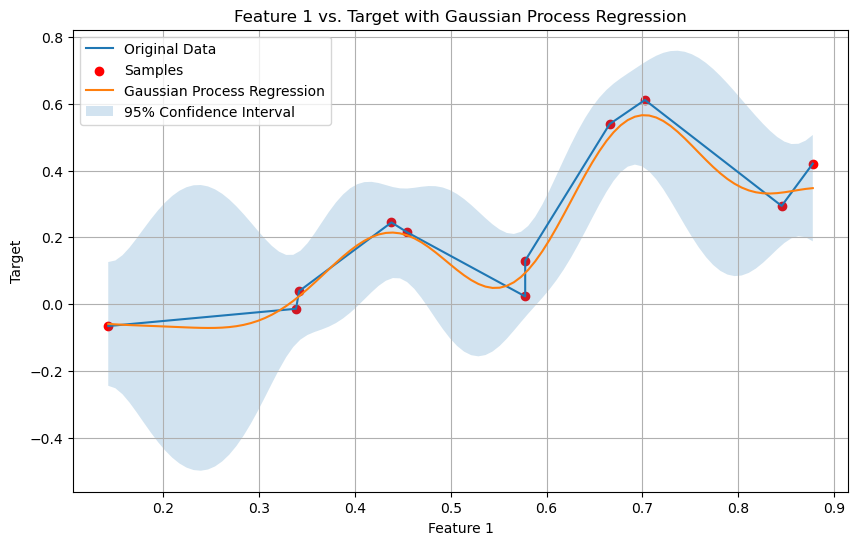

0.287**2 * RBF(length_scale=0.0808) + WhiteKernel(noise_level=1e-05)


In [100]:
from sklearn.gaussian_process.kernels import RBF, ConstantKernel as C, WhiteKernel

# Assuming df is already defined as in your provided code
# Sort the DataFrame by 'feature1'
df_sorted = df.sort_values('feature1')

# Prepare the data for the Gaussian Process Regressor
X = df_sorted[['feature1']].values  # Use only 'feature1' as input
y = df_sorted['target'].values

# Define a more complex kernel with a ConstantKernel, RBF, and WhiteKernel
kernel = C(1.0, (1e-3, 1e3)) * RBF(10, (1e-2, 1e2)) + WhiteKernel(noise_level=1e-5)


# Create and fit the Gaussian Process Regressor
gpr = GaussianProcessRegressor(kernel=kernel, alpha=0.01, n_restarts_optimizer=10, random_state=0)
gpr.fit(X, y)

# Predict target values and their standard deviations
X_pred = np.linspace(X.min(), X.max(), 100).reshape(-1, 1)  # Generate points for prediction
y_pred, sigma = gpr.predict(X_pred, return_std=True)

# Plot the results
plt.figure(figsize=(10, 6))
plt.plot(df_sorted['feature1'], df_sorted['target'], linestyle='-', label='Original Data')
plt.scatter(df_sorted['feature1'], df_sorted['target'], color='red', label='Samples')
plt.plot(X_pred, y_pred, label='Gaussian Process Regression')
plt.fill_between(X_pred.flatten(), y_pred - 1.96 * sigma, y_pred + 1.96 * sigma, alpha=0.2, label='95% Confidence Interval')
plt.xlabel('Feature 1')
plt.ylabel('Target')
plt.title('Feature 1 vs. Target with Gaussian Process Regression')
plt.legend()
plt.grid(True)
plt.show()

print(gpr.kernel_) # Print the optimized kernel parameters

/opt/anaconda3/lib/python3.12/site-packages/sklearn/gaussian_process/kernels.py:455: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k2__length_scale is close to the specified upper bound 100.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(


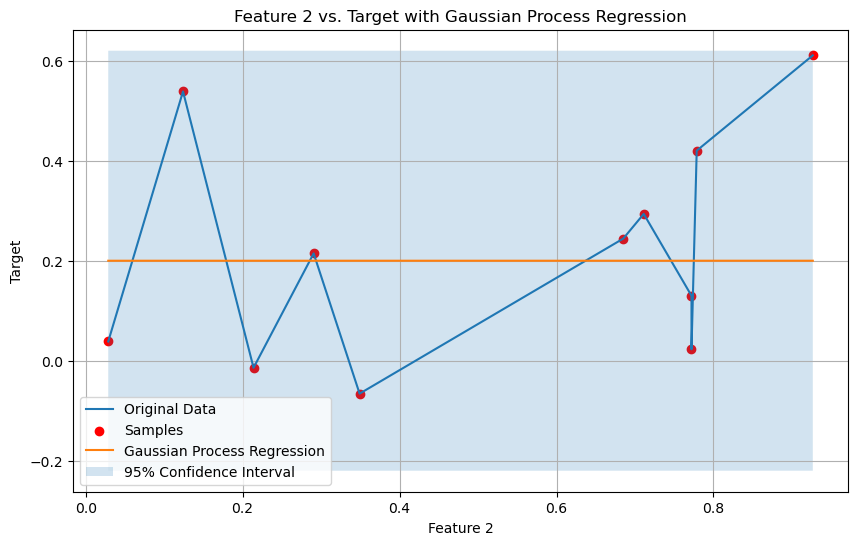

0.211**2 * RBF(length_scale=100) + WhiteKernel(noise_level=0.0417)


In [101]:
# Sort the DataFrame by 'feature2'
df_sorted = df.sort_values('feature2')

# Prepare the data for the Gaussian Process Regressor
X = df_sorted[['feature2']].values  # Use only 'feature2' as input
y = df_sorted['target'].values

# Define a more complex kernel with a ConstantKernel, RBF, and WhiteKernel
kernel = C(1.0, (1e-3, 1e3)) * RBF(10, (1e-2, 1e2)) + WhiteKernel(noise_level=1e-5)


# Create and fit the Gaussian Process Regressor with improved kernel and hyperparameters
gpr = GaussianProcessRegressor(kernel=kernel, alpha=0.01, n_restarts_optimizer=10, random_state=0)
gpr.fit(X, y)

# Predict target values and their standard deviations
X_pred = np.linspace(X.min(), X.max(), 100).reshape(-1, 1)  # Generate points for prediction
y_pred, sigma = gpr.predict(X_pred, return_std=True)

# Plot the results
plt.figure(figsize=(10, 6))
plt.plot(df_sorted['feature2'], df_sorted['target'], linestyle='-', label='Original Data')
plt.scatter(df_sorted['feature2'], df_sorted['target'], color='red', label='Samples')
plt.plot(X_pred, y_pred, label='Gaussian Process Regression')
plt.fill_between(X_pred.flatten(), y_pred - 1.96 * sigma, y_pred + 1.96 * sigma, alpha=0.2, label='95% Confidence Interval')
plt.xlabel('Feature 2')
plt.ylabel('Target')
plt.title('Feature 2 vs. Target with Gaussian Process Regression')
plt.legend()
plt.grid(True)
plt.show()

print(gpr.kernel_) # Print the optimized kernel parameters

/opt/anaconda3/lib/python3.12/site-packages/sklearn/gaussian_process/kernels.py:455: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__constant_value is close to the specified upper bound 1000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/gaussian_process/kernels.py:445: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__length_scale is close to the specified lower bound 0.01. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(


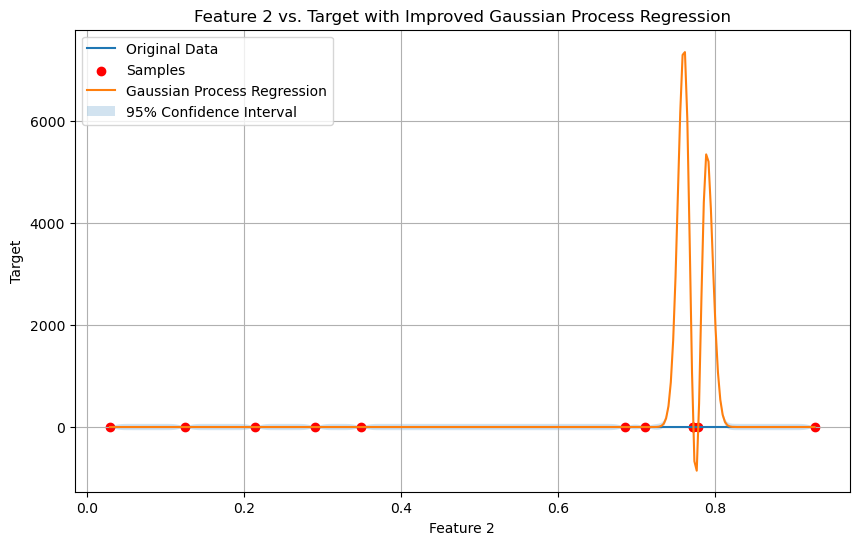

31.6**2 * RBF(length_scale=0.01)

In [102]:
from sklearn.gaussian_process.kernels import ConstantKernel as C, RBF

# Assuming df is already defined as in your provided code

# Prepare the data for the Gaussian Process Regressor
X = df[['feature2']].values  # Use only 'feature2' as input
y = df['target'].values

# Define a more flexible kernel for feature2
kernel = C(1.0, (1e-3, 1e3)) * RBF(length_scale=0.1, length_scale_bounds=(1e-2, 1e2)) # Adjust length_scale

# Create and fit the Gaussian Process Regressor with the improved kernel
gpr = GaussianProcessRegressor(kernel=kernel, alpha=1e-10, n_restarts_optimizer=10, random_state=0)
gpr.fit(X, y)

# Predict target values and their standard deviations
X_pred = np.linspace(X.min(), X.max(), 300).reshape(-1, 1)  # Generate points for prediction
y_pred, sigma = gpr.predict(X_pred, return_std=True)

# Plot the results
plt.figure(figsize=(10, 6))
plt.plot(df_sorted['feature2'], df_sorted['target'], linestyle='-', label='Original Data')
plt.scatter(df_sorted['feature2'], df_sorted['target'], color='red', label='Samples')
plt.plot(X_pred, y_pred, label='Gaussian Process Regression')
plt.fill_between(X_pred.flatten(), y_pred - 1.96 * sigma, y_pred + 1.96 * sigma, alpha=0.2, label='95% Confidence Interval')
plt.xlabel('Feature 2')
plt.ylabel('Target')
plt.title('Feature 2 vs. Target with Improved Gaussian Process Regression')
plt.legend()
plt.grid(True)
plt.show()

gpr.kernel_

/opt/anaconda3/lib/python3.12/site-packages/sklearn/gaussian_process/kernels.py:445: ConvergenceWarning: The optimal value found for dimension 0 of parameter length_scale is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(


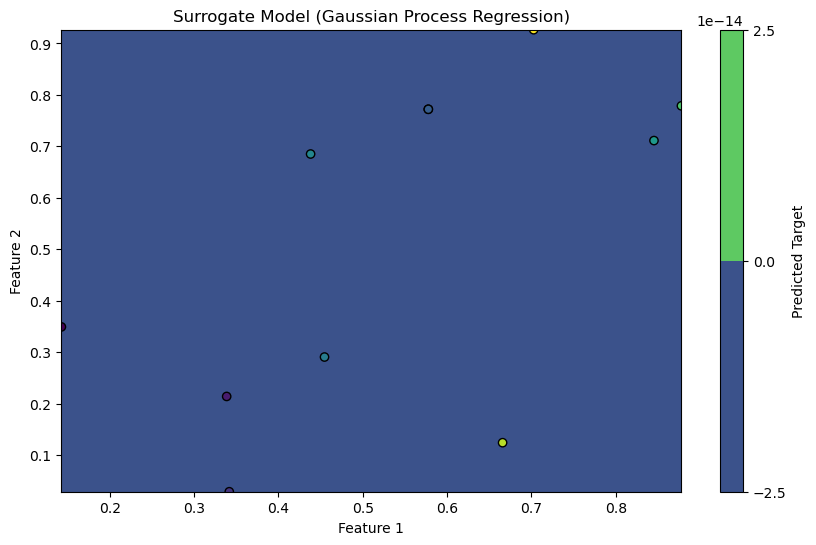

In [103]:
# Assuming 'inputs' and 'outputs' are defined as in the provided code.

# Create the Gaussian Process Regressor
kernel = RBF(length_scale=1.0)  # You can adjust the length_scale parameter
gpr = GaussianProcessRegressor(kernel=kernel, random_state=0)

# Fit the GPR model to the data
gpr.fit(inputs, outputs)

# Create a grid of points for prediction
x1_grid = np.linspace(min(inputs[:, 0]), max(inputs[:, 0]), 100)
x2_grid = np.linspace(min(inputs[:, 1]), max(inputs[:, 1]), 100)
x1_grid, x2_grid = np.meshgrid(x1_grid, x2_grid)
grid_points = np.column_stack([x1_grid.flatten(), x2_grid.flatten()])


# Predict the target values and standard deviations at the grid points
y_pred, sigma = gpr.predict(grid_points, return_std=True)

# Reshape predictions for plotting
y_pred = y_pred.reshape(x1_grid.shape)
sigma = sigma.reshape(x1_grid.shape)

# Create the plot
plt.figure(figsize=(10, 6))
contour = plt.contourf(x1_grid, x2_grid, y_pred, cmap='viridis')
plt.colorbar(contour, label='Predicted Target')

# Plot the original data points
plt.scatter(inputs[:, 0], inputs[:, 1], c=outputs, cmap='viridis', edgecolor='k', label='Samples')

# Add a title and labels
plt.title('Surrogate Model (Gaussian Process Regression)')
plt.xlabel('Feature 1')
plt.ylabel('Feature 2')

# Show the plot
plt.show()

In [104]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import RBF
from scipy.stats import norm

def expected_improvement(X, gpr, xi=0.01):
    mu, sigma = gpr.predict(X, return_std=True)
    mu_sample_opt = np.max(gpr.y_train_)
    with np.errstate(divide='ignore'):
        Z = (mu - mu_sample_opt - xi) / sigma
        ei = (mu - mu_sample_opt - xi) * norm.cdf(Z) + sigma * norm.pdf(Z)
        ei[sigma == 0.0] = 0.0
    return ei

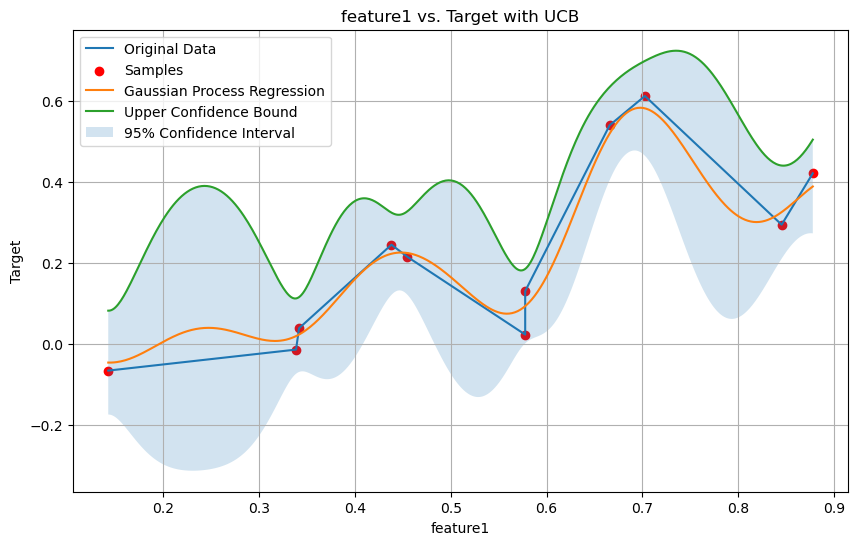

/opt/anaconda3/lib/python3.12/site-packages/sklearn/gaussian_process/kernels.py:445: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k2__length_scale is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/gaussian_process/kernels.py:445: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__k2__length_scale is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(


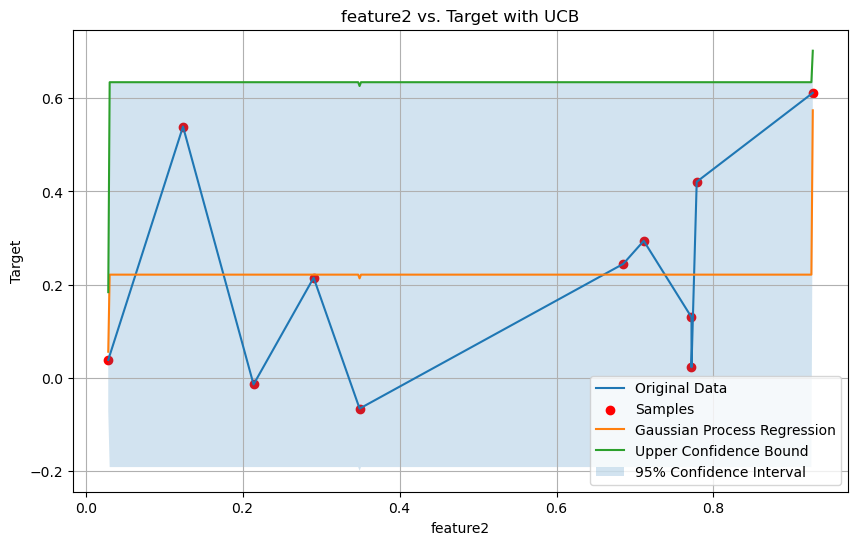

In [105]:
for feature in ['feature1', 'feature2']:
    df_sorted = df.sort_values(feature)
    X = df_sorted[[feature]].values
    y = df_sorted['target'].values

    kernel = 1.0 * RBF(length_scale=1.0) + 1.0 * RBF(length_scale=0.1)
    gpr = GaussianProcessRegressor(kernel=kernel, alpha=0.1, n_restarts_optimizer=20, normalize_y=True, random_state=0)
    gpr.fit(X, y)

    X_pred = np.linspace(X.min(), X.max(), 500).reshape(-1, 1)
    y_pred, sigma = gpr.predict(X_pred, return_std=True)

    # Calculate Upper Confidence Bound
    upper_confidence_bound = y_pred + 1.96 * sigma

    plt.figure(figsize=(10, 6))
    plt.plot(df_sorted[feature], df_sorted['target'], linestyle='-', label='Original Data')
    plt.scatter(df_sorted[feature], df_sorted['target'], color='red', label='Samples')
    plt.plot(X_pred, y_pred, label='Gaussian Process Regression')
    plt.plot(X_pred, upper_confidence_bound, label='Upper Confidence Bound')
    plt.fill_between(X_pred.flatten(), y_pred - 1.96 * sigma, y_pred + 1.96 * sigma, alpha=0.2, label='95% Confidence Interval')
    plt.xlabel(feature)
    plt.ylabel('Target')
    plt.title(f'{feature} vs. Target with UCB')
    plt.legend()
    plt.grid(True)
    plt.show()

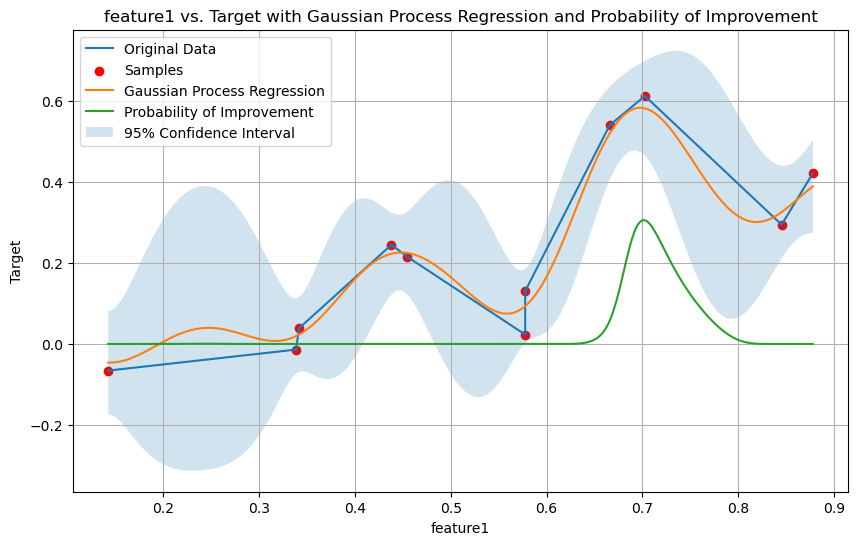

/opt/anaconda3/lib/python3.12/site-packages/sklearn/gaussian_process/kernels.py:445: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k2__length_scale is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/gaussian_process/kernels.py:445: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__k2__length_scale is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(


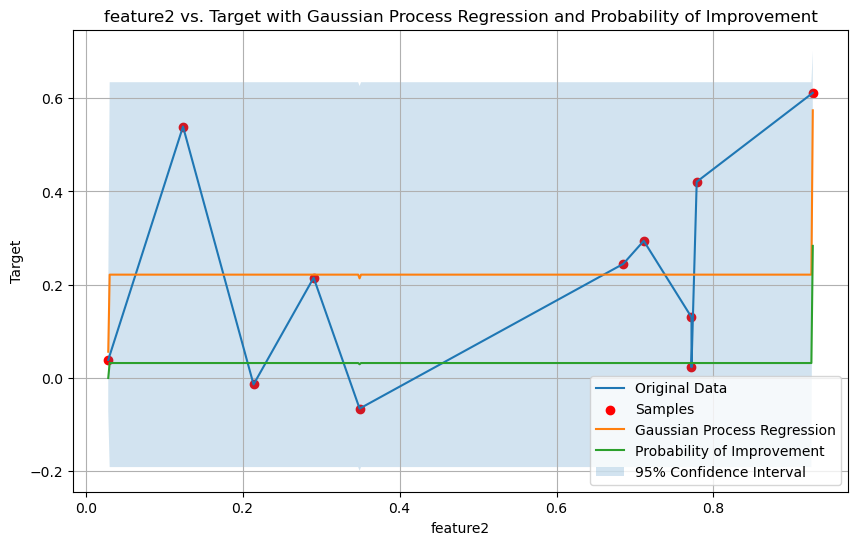

In [106]:
for feature in ['feature1', 'feature2']:
    df_sorted = df.sort_values(feature)
    X = df_sorted[[feature]].values
    y = df_sorted['target'].values

    kernel = 1.0 * RBF(length_scale=1.0) + 1.0 * RBF(length_scale=0.1)
    gpr = GaussianProcessRegressor(kernel=kernel, alpha=0.1, n_restarts_optimizer=20, normalize_y=True, random_state=0)
    gpr.fit(X, y)

    X_pred = np.linspace(X.min(), X.max(), 500).reshape(-1, 1)
    y_pred, sigma = gpr.predict(X_pred, return_std=True)

    # Calculate Probability of Improvement
    y_best = np.max(y)  # Current best observed target value
    poi = norm.cdf((y_pred - y_best) / sigma)

    plt.figure(figsize=(10, 6))
    plt.plot(df_sorted[feature], df_sorted['target'], linestyle='-', label='Original Data')
    plt.scatter(df_sorted[feature], df_sorted['target'], color='red', label='Samples')
    plt.plot(X_pred, y_pred, label='Gaussian Process Regression')
    plt.plot(X_pred, poi, label='Probability of Improvement') #Plot POI
    plt.fill_between(X_pred.flatten(), y_pred - 1.96 * sigma, y_pred + 1.96 * sigma, alpha=0.2, label='95% Confidence Interval')
    plt.xlabel(feature)
    plt.ylabel('Target')
    plt.title(f'{feature} vs. Target with Gaussian Process Regression and Probability of Improvement')
    plt.legend()
    plt.grid(True)
    plt.show()

In [107]:
print('Running...........')

# Find the best feature1 value based on the maximum EI
def find_best_feature1(df, gpr):
    # Generate a wide range of feature1 values for evaluation.
    X_pred = np.linspace(df['feature1'].min() - 0.1, df['feature1'].max() + 0.1, 500).reshape(-1, 1)
    ei = expected_improvement(X_pred, gpr)
    best_feature1 = X_pred[np.argmax(ei)][0]  # Find the feature1 value with max EI
    return best_feature1

# Prepare data for feature1
X_feature1 = df[['feature1']].values
y_feature1 = df['target'].values

# Define the kernel for feature1
kernel_feature1 = C(1.0, (1e-3, 1e3)) * RBF(10, (1e-2, 1e2)) + WhiteKernel(noise_level=1e-5)

# Fit the GPR model for feature1
gpr_feature1 = GaussianProcessRegressor(kernel=kernel_feature1, alpha=0.01, n_restarts_optimizer=10, random_state=0)
gpr_feature1.fit(X_feature1, y_feature1)

# Find the best feature1
best_feature1 = find_best_feature1(df, gpr_feature1)
print(f"Best feature1 value for maximum EI: {best_feature1}")

Running...........
Best feature1 value for maximum EI: 0.7229362787603077


/opt/anaconda3/lib/python3.12/site-packages/sklearn/gaussian_process/kernels.py:445: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(


In [108]:
# Function to calculate Expected Improvement
def expected_improvement(X, gpr, xi=0.01):
    mu, sigma = gpr.predict(X, return_std=True)
    mu_sample_opt = np.max(gpr.y_train_)
    with np.errstate(divide='ignore'):
        Z = (mu - mu_sample_opt - xi) / sigma
        ei = (mu - mu_sample_opt - xi) * norm.cdf(Z) + sigma * norm.pdf(Z)
        ei[sigma == 0.0] = 0.0
    return ei

# Function to calculate Upper Confidence Bound
def upper_confidence_bound(X, gpr, kappa=1.96):
    mu, sigma = gpr.predict(X, return_std=True)
    ucb = mu + kappa * sigma
    return ucb

# Function to calculate Probability of Improvement
def probability_of_improvement(X, gpr, xi=0.01):
    mu, sigma = gpr.predict(X, return_std=True)
    mu_sample_opt = np.max(gpr.y_train_)
    with np.errstate(divide='ignore'):
        Z = (mu - mu_sample_opt - xi) / sigma
        poi = norm.cdf(Z)
    return poi

# Fit a new GPR model with both features outside the loop
kernel = 1.0 * RBF(length_scale=1.0) + 1.0 * RBF(length_scale=0.1)
gpr = GaussianProcessRegressor(kernel=kernel, alpha=0.1, n_restarts_optimizer=20, normalize_y=True, random_state=0)
gpr.fit(df[['feature1', 'feature2']], df['target'])  # Fit using both features

# Find the best feature1 value for each acquisition function
best_feature1_ei = None
best_ei = -np.inf
best_feature1_ucb = None
best_ucb = -np.inf
best_feature1_poi = None
best_poi = -np.inf

for feature1_candidate in np.linspace(min(df['feature1']), max(df['feature1']), 100):
    X_candidate = np.array([[feature1_candidate, df['feature2'].iloc[0]]]) # Using the first feature2 as a placeholder
    current_ei = expected_improvement(X_candidate, gpr)[0]
    current_ucb = upper_confidence_bound(X_candidate, gpr)[0]
    current_poi = probability_of_improvement(X_candidate, gpr)[0]

    if current_ei > best_ei:
      best_ei = current_ei
      best_feature1_ei = feature1_candidate

    if current_ucb > best_ucb:
      best_ucb = current_ucb
      best_feature1_ucb = feature1_candidate

    if current_poi > best_poi:
      best_poi = current_poi
      best_feature1_poi = feature1_candidate

print(f"Best feature1 for EI: {best_feature1_ei}, EI value: {best_ei}")
print(f"Best feature1 for UCB: {best_feature1_ucb}, UCB value: {best_ucb}")
print(f"Best feature1 for POI: {best_feature1_poi}, POI value: {best_poi}")

Best feature1 for EI: 0.8777909889953304, EI value: 3.4926184238837965e-14
Best feature1 for UCB: 0.8035392804337764, UCB value: 0.755227838161039
Best feature1 for POI: 0.8777909889953304, POI value: 1.1914092871047703e-12


/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but GaussianProcessRegressor was fitted with feature names
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but GaussianProcessRegressor was fitted with feature names
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but GaussianProcessRegressor was fitted with feature names
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but GaussianProcessRegressor was fitted with feature names
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but GaussianProcessRegressor was fitted with feature names
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/s

In [ ]:
# Find the best feature values for each acquisition function
best_feature1_ei = None
best_feature2_ei = None
best_ei = -np.inf

best_feature1_ucb = None
best_feature2_ucb = None
best_ucb = -np.inf

best_feature1_poi = None
best_feature2_poi = None
best_poi = -np.inf

# Define a finer grid for searching the best feature values
num_points = 200 # Increased the number of grid points for better accuracy
feature1_candidates = np.linspace(min(df['feature1']), max(df['feature1']), num_points)
feature2_candidates = np.linspace(min(df['feature2']), max(df['feature2']), num_points)


for feature1_candidate in feature1_candidates:
    for feature2_candidate in feature2_candidates:
        X_candidate = np.array([[feature1_candidate, feature2_candidate]])
        current_ei = expected_improvement(X_candidate, gpr)[0]
        current_ucb = upper_confidence_bound(X_candidate, gpr)[0]
        current_poi = probability_of_improvement(X_candidate, gpr)[0]


        if current_ei > best_ei:
            best_ei = current_ei
            best_feature1_ei = feature1_candidate
            best_feature2_ei = feature2_candidate

        if current_ucb > best_ucb:
            best_ucb = current_ucb
            best_feature1_ucb = feature1_candidate
            best_feature2_ucb = feature2_candidate

        if current_poi > best_poi:
            best_poi = current_poi
            best_feature1_poi = feature1_candidate
            best_feature2_poi = feature2_candidate

# Print the best feature values for each acquisition function to six significant figures.
print(f"Best feature values for EI: feature1={best_feature1_ei:.6f}, feature2={best_feature2_ei:.6f}, EI value: {best_ei:.6f}")
print(f"Best feature values for UCB: feature1={best_feature1_ucb:.6f}, feature2={best_feature2_ucb:.6f}, UCB value: {best_ucb:.6f}")
print(f"Best feature values for POI: feature1={best_feature1_poi:.6f}, feature2={best_feature2_poi:.6f}, POI value: {best_poi:.6f}")


# Create a new data array containing the best feature values
new_data_array = np.array([
    [best_feature1_ei, best_feature2_ei],
    [best_feature1_ucb, best_feature2_ucb],
    [best_feature1_poi, best_feature2_poi]
])

print("\nNew data array:")
new_data_array

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but GaussianProcessRegressor was fitted with feature names
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but GaussianProcessRegressor was fitted with feature names
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but GaussianProcessRegressor was fitted with feature names
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but GaussianProcessRegressor was fitted with feature names
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but GaussianProcessRegressor was fitted with feature names
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/s

In [ ]:
best_feature_values = {}

for feature in ['feature1', 'feature2']:
    df_sorted = df.sort_values(feature)
    X = df_sorted[[feature]].values
    y = df_sorted['target'].values
    kernel = 1.0 * RBF(length_scale=1.0) + 1.0 * RBF(length_scale=0.1)
    gpr = GaussianProcessRegressor(kernel=kernel, alpha=0.1, n_restarts_optimizer=20, normalize_y=True, random_state=0)
    gpr.fit(X, y)
    X_pred = np.linspace(X.min(), X.max(), 500).reshape(-1, 1)
    y_pred, sigma = gpr.predict(X_pred, return_std=True)

    # Use the prediction with the highest value (you can change the acquisition function if needed)
    best_index = np.argmax(y_pred)
    best_feature_value = X_pred[best_index][0]
    best_feature_values[feature] = best_feature_value

# Create a new data array with the best values
new_data_array = np.array(list(best_feature_values.values()))

# Display the results formatted to six significant figures
print("Single Best Values for Each Feature (6 significant figures):")
for feature, value in best_feature_values.items():
    print(f"{feature}: {value:.6f}")

print("\nNew Data Array:")
new_data_array

In [59]:
# 5. (Optional) Add a small amount of noise to the new input data point
# to avoid overfitting to the specific grid point
new_input_data = new_data_array
noise_stddev = 0.01 # Adjust the noise level as needed
new_input_data += np.random.normal(0, noise_stddev, size=2)

print("New Input Data (with noise):", new_input_data)

New Input Data (with noise): [0.72264494 1.03661831]


In [61]:
print("New Input Data (with noise):", [round(x, 6) for x in new_input_data])

New Input Data (with noise): [0.722645, 1.036618]


In [139]:
inputs

array([[0.66579958, 0.12396913],
       [0.87779099, 0.7786275 ],
       [0.14269907, 0.34900513],
       [0.84527543, 0.71112027],
       [0.45464714, 0.29045518],
       [0.57771284, 0.77197318],
       [0.43816606, 0.68501826],
       [0.34174959, 0.02869772],
       [0.33864816, 0.21386725],
       [0.70263656, 0.9265642 ],
       [0.577713  , 0.771973  ]])

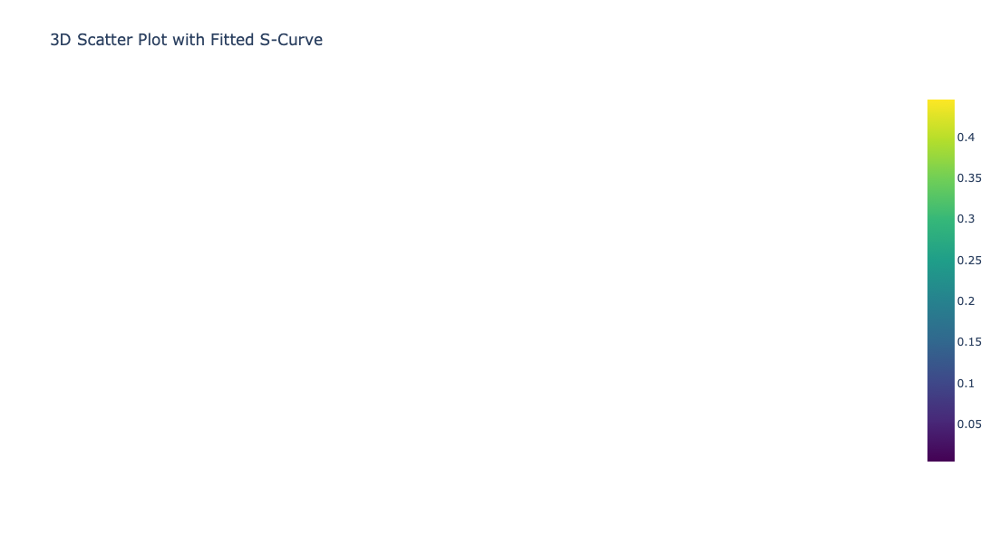

In [141]:
# prompt: Using dataframe df: 3d plot of df with fitting s curve function & allows rotation of output

import plotly.graph_objects as go
import numpy as np
from scipy.optimize import curve_fit

# Define the s-curve function
def s_curve(x, a, b, c):
    return c / (1 + np.exp(-a * (x - b)))

# Prepare data for fitting
x_data = df['feature1']  
y_data = df['feature2']
z_data = df['target']

# Fit the s-curve to the target variable
popt, _ = curve_fit(s_curve, x_data, z_data) # Fit s-curve to feature1 and target

# Generate surface points for the fitted s-curve
x_fit = np.linspace(x_data.min(), x_data.max(), 100)
y_fit = np.linspace(y_data.min(), y_data.max(), 100)
x_fit_grid, y_fit_grid = np.meshgrid(x_fit, y_fit)
z_fit_grid = s_curve(x_fit_grid, *popt)


# Create the 3D scatter plot
fig = go.Figure(data=[go.Scatter3d(x=df['feature1'],
                                y=df['feature2'],
                                z=df['target'],
                                mode='markers',
                                marker=dict(size=5))])

# Add the fitted s-curve surface
fig.add_trace(go.Surface(x=x_fit_grid, y=y_fit_grid, z=z_fit_grid, opacity=0.7, colorscale='viridis', name='Fitted S-curve'))


# Customize the plot
fig.update_layout(scene=dict(xaxis_title='Feature 1', yaxis_title='Feature 2', zaxis_title='Target'),
                  title='3D Scatter Plot with Fitted S-Curve',
                  width=800, height=600)

# Enable rotation of the 3D plot
fig.update_layout(scene_aspectmode='cube') # Set aspect ratio to make it a cube


fig.show()

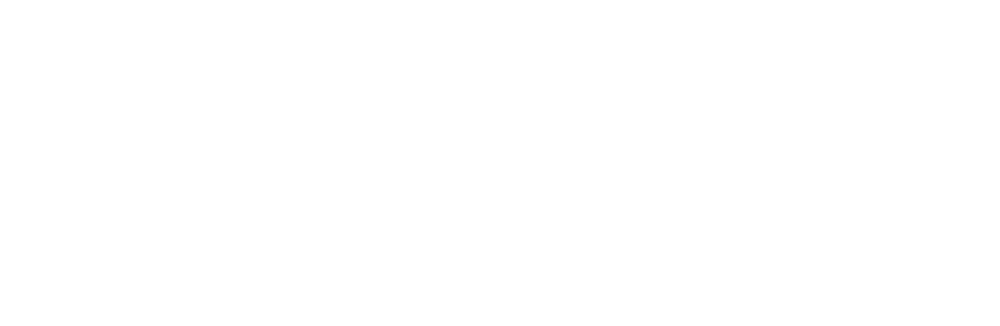

In [145]:
import plotly.express as px

# Create the 3D scatter plot
fig = px.scatter_3d(df, x='feature1', y='feature2', z='target')

# Update layout to enable rotation
fig.update_layout(scene=dict(
    xaxis_title='Feature 1',
    yaxis_title='Feature 2',
    zaxis_title='Target',
    aspectmode='cube' # ensures axes are scaled equally
))

fig.show()

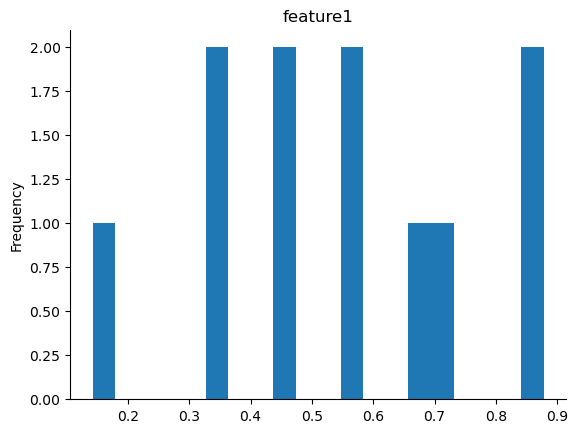

In [147]:
from matplotlib import pyplot as plt
df['feature1'].plot(kind='hist', bins=20, title='feature1')
plt.gca().spines[['top', 'right',]].set_visible(False)

In [ ]:
from matplotlib import pyplot as plt
df['feature2'].plot(kind='hist', bins=20, title='feature2')
plt.gca().spines[['top', 'right',]].set_visible(False)

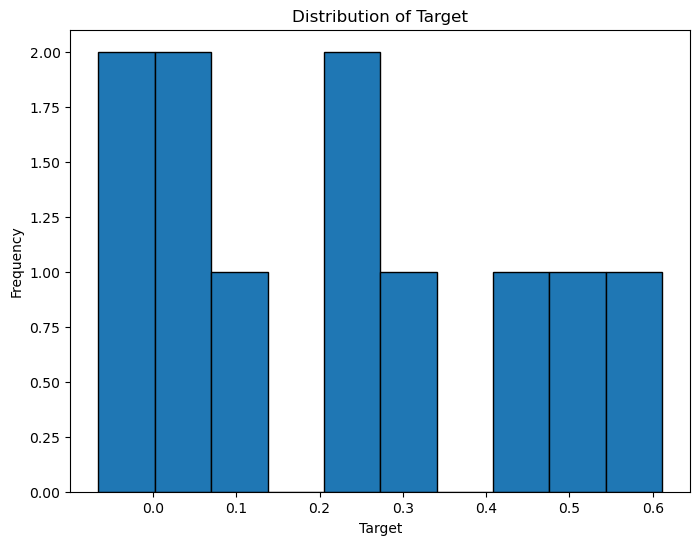

In [57]:
plt.figure(figsize=(8, 6))
plt.hist(df['target'], bins=10, edgecolor='black')
plt.title('Distribution of Target')
plt.xlabel('Target')
_ = plt.ylabel('Frequency')

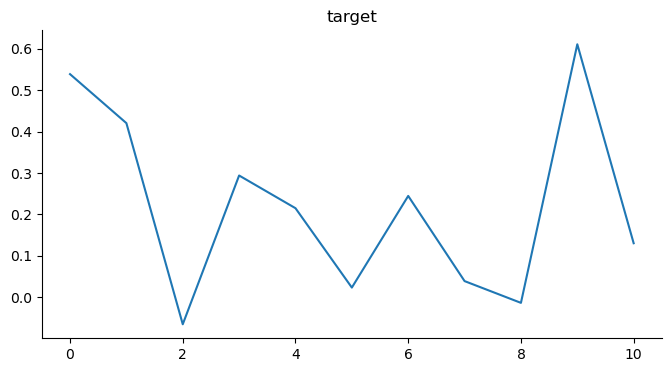

In [59]:
from matplotlib import pyplot as plt
df['target'].plot(kind='line', figsize=(8, 4), title='target')
plt.gca().spines[['top', 'right']].set_visible(False)

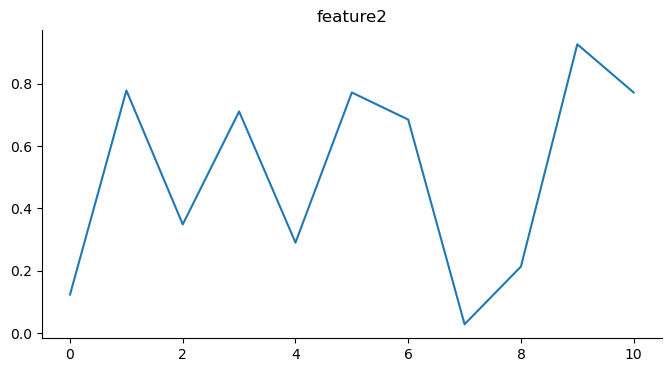

In [61]:
from matplotlib import pyplot as plt
df['feature2'].plot(kind='line', figsize=(8, 4), title='feature2')
plt.gca().spines[['top', 'right']].set_visible(False)

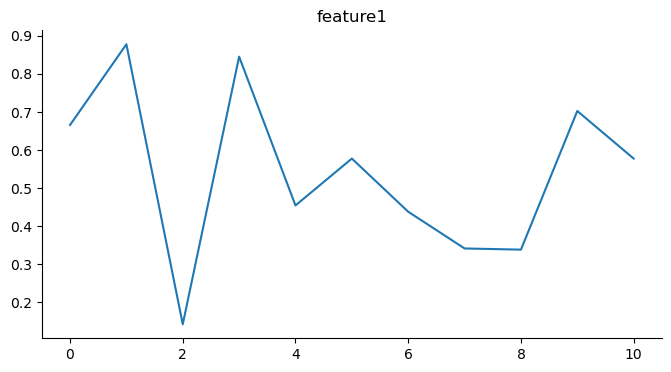

In [63]:
from matplotlib import pyplot as plt
df['feature1'].plot(kind='line', figsize=(8, 4), title='feature1')
plt.gca().spines[['top', 'right']].set_visible(False)

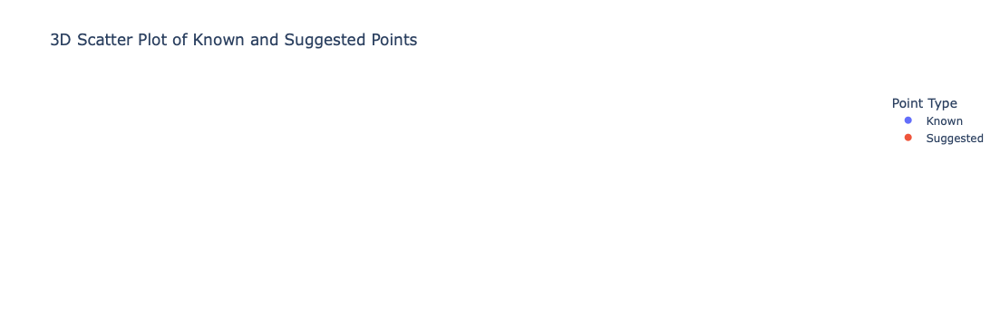

In [65]:
import plotly.express as px
from sklearn.gaussian_process.kernels import ConstantKernel as C

# ... (your existing code) ...

# Define the kernel (make sure to import C and RBF)
kernel = C(1.0, (1e-3, 1e3)) * RBF(10, (1e-2, 1e2))

# Assuming 'suggestions' and 'inputs', 'outputs' are defined from previous code
# Convert suggestions to numpy array if it's not already
suggestions = np.array(suggestions)

# Predict target values for the suggested points
predicted_targets = gp.predict(suggestions)

# Create a DataFrame for plotting with plotly
plot_df = pd.DataFrame({
    'Feature 1': np.concatenate([inputs[:, 0], suggestions[:, 0]]),
    'Feature 2': np.concatenate([inputs[:, 1], suggestions[:, 1]]),
    'Target': np.concatenate([outputs, predicted_targets]),
    'Point Type': ['Known'] * len(inputs) + ['Suggested'] * len(suggestions)
})

# Create the 3D scatter plot using plotly express
fig = px.scatter_3d(plot_df, x='Feature 1', y='Feature 2', z='Target', color='Point Type',
                    title='3D Scatter Plot of Known and Suggested Points')

fig.update_layout(scene=dict(
    xaxis_title='Feature 1',
    yaxis_title='Feature 2',
    zaxis_title='Target',
    aspectmode='cube'  # ensures axes are scaled equally
))

fig.show()

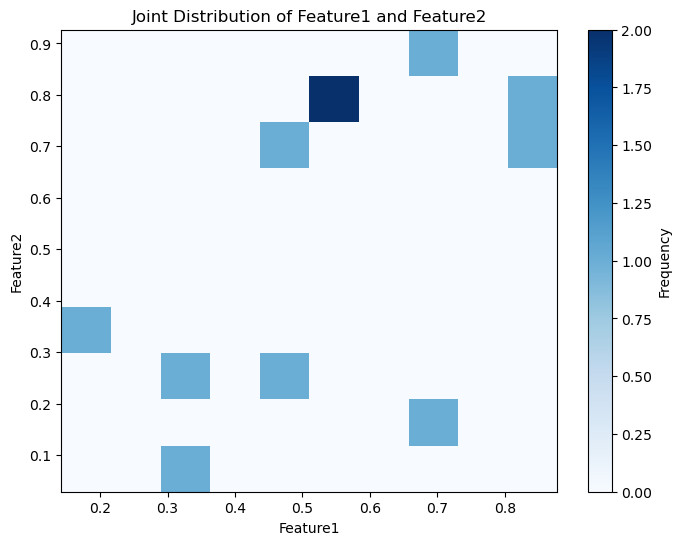

In [67]:
import matplotlib.pyplot as plt
import numpy as np

plt.figure(figsize=(8, 6))
plt.hist2d(df['feature1'], df['feature2'], bins=10, cmap='Blues')
plt.colorbar(label='Frequency')
plt.title('Joint Distribution of Feature1 and Feature2')
plt.xlabel('Feature1')
_ = plt.ylabel('Feature2')

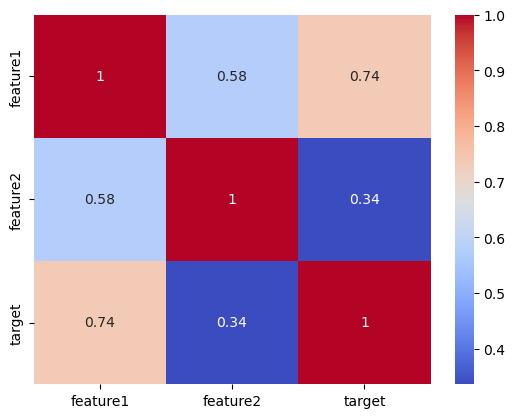

In [69]:
# Display correlation to Output Outcome
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from matplotlib.animation import FuncAnimation
from IPython.display import HTML
import seaborn as sns
numerical_df = df.select_dtypes(include=[np.number])
correlation_matrix = numerical_df.corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
plt.show()

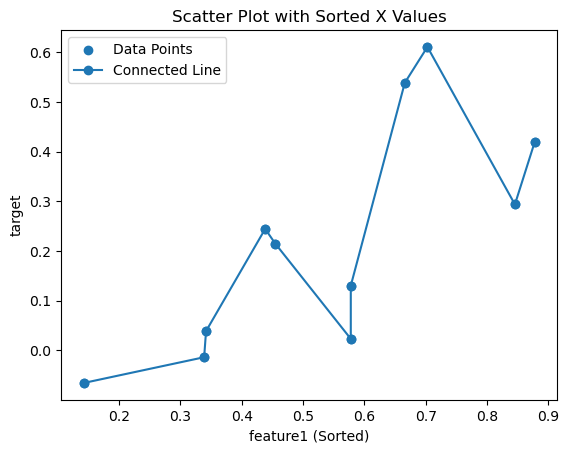

In [71]:
x = df["feature1"]
y = df["target"]

# Sort x values and get corresponding y values
sorted_indices = np.argsort(x)
x_sorted = np.array(x)[sorted_indices]
y_sorted = np.array(y)[sorted_indices]

# Create the scatter plot
plt.scatter(x_sorted, y_sorted, label='Data Points')


# Connect the dots with a line
#plt.plot(x, y, linestyle='-', marker='o', label='Connected Line')
plt.plot(x_sorted, y_sorted, linestyle='-', marker='o', label='Connected Line')

# Add labels and title
#plt.xlabel("X-axis")
#plt.ylabel("Y-axis")
#plt.title("Scatter Plot")

# Add labels and title
plt.xlabel('feature1 (Sorted)')
plt.ylabel('target')
plt.title('Scatter Plot with Sorted X Values')

# Add legend
plt.legend()

# Show the plot
plt.show()

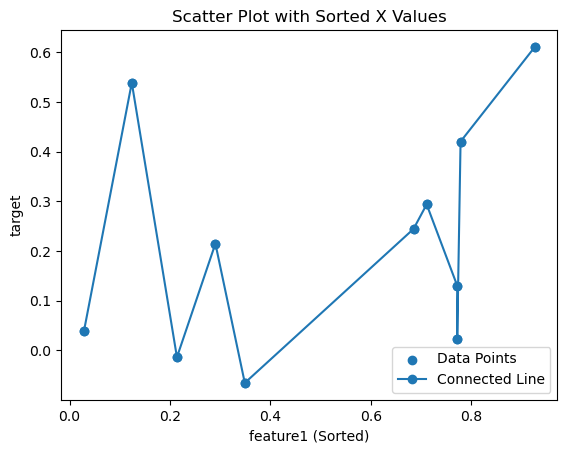

In [73]:
x = df["feature2"]
y = df["target"]

# Sort x values and get corresponding y values
sorted_indices = np.argsort(x)
x_sorted = np.array(x)[sorted_indices]
y_sorted = np.array(y)[sorted_indices]

# Create the scatter plot
plt.scatter(x_sorted, y_sorted, label='Data Points')

# Connect the dots with a line
#plt.plot(x, y, linestyle='-', marker='o', label='Connected Line')
plt.plot(x_sorted, y_sorted, linestyle='-', marker='o', label='Connected Line')

# Add labels and title
#plt.xlabel("X-axis")
#plt.ylabel("Y-axis")
#plt.title("Scatter Plot")

# Add labels and title
plt.xlabel('feature1 (Sorted)')
plt.ylabel('target')
plt.title('Scatter Plot with Sorted X Values')

# Add legend
plt.legend()

# Show the plot
plt.show()

In [161]:
inputs

array([[0.66579958, 0.12396913],
       [0.87779099, 0.7786275 ],
       [0.14269907, 0.34900513],
       [0.84527543, 0.71112027],
       [0.45464714, 0.29045518],
       [0.57771284, 0.77197318],
       [0.43816606, 0.68501826],
       [0.34174959, 0.02869772],
       [0.33864816, 0.21386725],
       [0.70263656, 0.9265642 ],
       [0.577713  , 0.771973  ]])

In [63]:
print("New Input Data (with noise):", [round(x, 6) for x in new_input_data])

New Input Data (with noise): [0.722645, 1.036618]
